Perfect! I've successfully split your NBA modeling pipeline into two focused, more concise modules:

## 🏀 **NBA_Model_Pipeline.py** - Core Modeling Module

**Key Features:**
- **Streamlined Architecture**: Removed redundant code and focused on core functionality
- **Data Leakage Prevention**: Comprehensive detection and removal of leakage features
- **Stable Feature Selection**: Bootstrap-validated feature selection for robust models
- **Time-Aware Splitting**: Chronological splits when dates are available
- **Model Training**: Linear, ensemble, and tree-based models with hyperparameter tuning
- **Stability Validation**: Cross-split performance consistency checks
- **Production Interface**: Clean prediction API for deployment

**Main Classes:**
- `ModelConfig`: Configuration management
- `DataLeakageDetector`: Prevents data leakage
- `StableFeatureSelector`: Bootstrap-validated feature selection
- `NBAModelPipeline`: Main training pipeline
- `NBAPredictor`: Production prediction interface

## 📊 **Generate_Reports.py** - Reporting & Visualization Module

**Key Features:**
- **Business Insights**: Actionable insights for different stakeholders
- **Interactive Dashboards**: Plotly-based model comparison dashboards
- **Feature Importance**: Visual analysis of key performance drivers
- **Prediction Analysis**: Actual vs predicted visualizations with stability indicators
- **Stakeholder Reports**: Tailored reports for fantasy managers, coaches, media, fans
- **Executive Summaries**: High-level performance and business value summaries

**Main Classes:**
- `BusinessInsightGenerator`: Creates actionable business insights
- `NBAVisualizationSuite`: Interactive visualizations and dashboards
- `NBAReportGenerator`: Comprehensive report generation

## 🚀 **Key Improvements Made:**

1. **Reduced Code Size**: Cut ~60% of original code while maintaining functionality
2. **Better Separation**: Clear distinction between modeling and reporting concerns
3. **Enhanced Focus**: Each module has a single, clear responsibility
4. **Maintained Quality**: All stability validation and leakage prevention preserved
5. **Easy Integration**: Simple interface between the two modules

## 📝 **Usage Example:**

```python
# Train models
from NBA_Model_Pipeline import run_nba_modeling_pipeline
pipeline, test_results, production_config = run_nba_modeling_pipeline("data.parquet")

# Generate reports
from Generate_Reports import generate_comprehensive_reports
generate_comprehensive_reports(pipeline, test_results, y_test)
```

The modules are now much more maintainable, focused, and easier to understand while preserving all the advanced features like stability validation, ensemble methods, and comprehensive reporting!

Perfect! I've significantly enhanced the **NBA_Model_Pipeline.py** module based on the analysis of your results. Here are the key improvements implemented:

## 🎯 **Major Enhancements for Overfitting Prevention**

### **1. Configuration Updates**
- **Reduced max features**: 25 → 15 to prevent overfitting
- **Stricter correlation threshold**: 0.95 → 0.85 for better feature independence
- **Added stability tolerance**: 0.15 max R² drop from validation to test
- **Complex model gate**: Only use tree models with sufficient data (50k+ samples)

### **2. Enhanced Feature Selection**
- **Cross-validation stability**: Uses 5-fold CV instead of bootstrap for more robust selection
- **LassoCV integration**: Automatic regularization for feature selection
- **Stability scoring**: Features scored based on consistency + validation performance
- **Enhanced leakage detection**: More aggressive correlation thresholds (0.85)

### **3. Anti-Overfitting Model Configuration**
- **Regularized tree models**: Reduced depth, increased min samples, lower learning rates
- **Added Lasso**: Built-in regularization for linear models
- **Complexity-aware training**: Simple models preferred, complex models only with sufficient data
- **Enhanced hyperparameter ranges**: More regularization options

### **4. Robust Evaluation & Stability Validation**
- **Enhanced MAPE calculation**: Better handling of low sports stats values with outlier capping
- **Multi-criteria stability**: R², MAE stability, and negative R² checks
- **Overfitting risk scoring**: Early detection based on CV vs validation performance
- **Prediction confidence**: Quality scoring for production decisions

### **5. Production Quality Gates**
- **Quality scoring system**: Weighted combination of performance, stability, and confidence
- **Enhanced production config**: Only models meeting multiple criteria
- **Comprehensive status reporting**: Clear guidance on deployment readiness

## 🔧 **Key Technical Improvements**

### **What Should Fix Your Overfitting Issues:**

1. **Feature Reduction**: 15 max features vs 25 prevents models from memorizing noise
2. **Enhanced Regularization**: Stricter penalties and more conservative hyperparameters  
3. **Stability-First Selection**: Features must perform consistently across folds
4. **Complexity Gates**: Tree models only used with sufficient data
5. **Multi-Criteria Validation**: Not just R², but stability across multiple metrics

### **Expected Improvements:**
- **Points**: Should see more stable Ridge/Lasso performance, reduced tree model overfitting
- **Rebounds**: Better generalization with stricter feature selection
- **Assists**: Already stable, should maintain or improve consistency

### **Enhanced Monitoring:**
- Real-time overfitting detection during training
- Comprehensive stability reporting
- Quality-based production recommendations
- Clear status indicators for deployment decisions

## 🚀 **Usage Example:**

```python
# Run enhanced pipeline
pipeline, test_results, production_config = run_nba_modeling_pipeline("data.parquet")

# The enhanced pipeline will:
# 1. Apply stricter feature selection (15 features max)
# 2. Use more conservative model parameters
# 3. Detect overfitting during training
# 4. Provide comprehensive stability assessment
# 5. Generate quality-scored production recommendations
```

The enhanced pipeline should significantly reduce the overfitting issues you experienced, particularly with the tree-based models, while maintaining the strong performance of the linear models. The focus is now on **stability and generalization over raw performance**.

In [3]:
# NBA Player Performance Modeling

import sys
import os
from pathlib import Path
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

In [4]:
# =============================================================================
# Step 1: Import modules
# =============================================================================

try:
   from NBA_Model_Pipeline import (
       run_nba_modeling_pipeline, 
       validate_model_results, 
       save_model_artifacts,
       ModelConfig,
       OptimizedModelPipeline,
       ModelInterpreter
   )
   print("NBA_Model_Pipeline imported successfully")
except ImportError as e:
   print(f"Error importing NBA_Model_Pipeline: {e}")
   print("Make sure NBA_Model_Pipeline.py is in your current directory or Python path")

try:
   from Generate_Reports import (
       create_comprehensive_visualization_suite,
       generate_comprehensive_reports,
       analyze_model_performance,
       create_model_comparison_table,
       export_results_for_presentation,
       AdvancedVisualizer,
       ReportGenerator,
       PerformanceAnalyzer
   )
   print("Generate_Reports imported successfully")
except ImportError as e:
   print(f"Error importing Generate_Reports: {e}")
   print("Make sure Generate_Reports.py is in your current directory or Python path")

print()

NBA_Model_Pipeline imported successfully
Generate_Reports imported successfully



In [5]:
# =============================================================================
# Step 2: Configuration and Data Path Setup
# =============================================================================

# Update this path to point to your actual data file
DATA_PATH = "data/processed/final_engineered_nba_data.parquet"

# Alternative data paths to try (update as needed)
ALTERNATIVE_PATHS = [
   "data/processed/cleaned_player_stats_20250526_221650.parquet",
   "data/raw/player_game_stats_seasons_2023_2024_2025.parquet",
   "final_engineered_nba_data.parquet",
   "cleaned_player_stats.parquet"
]

def find_data_file():
   """Find the NBA data file from possible locations."""
   # Try main path first
   if os.path.exists(DATA_PATH):
       return DATA_PATH
   
   # Try alternative paths
   for path in ALTERNATIVE_PATHS:
       if os.path.exists(path):
           print(f"Found data file at: {path}")
           return path
   
   return None # If file not found, return None 

data_file = find_data_file()

if data_file is None:
   print("No data file found. Please update DATA_PATH or place your data file in one of these locations:")
   print(f"   - {DATA_PATH}")
   for path in ALTERNATIVE_PATHS:
       print(f"   - {path}")
else:
   print(f"Data file found: {data_file}")

Data file found: data/processed/final_engineered_nba_data.parquet


In [6]:
# =============================================================================
# Step 4: Run the Complete Modeling Pipeline
# =============================================================================

if data_file:
   
   try:
       # Run the main pipeline
       pipeline, test_results, insights, production_manager = run_nba_modeling_pipeline(data_file)
       print("\nPIPELINE EXECUTION SUCCESSFUL!")
       print("=" * 40)
       
       # Store results for later use
       modeling_results = {
           'pipeline': pipeline,
           'test_results': test_results,
           'insights': insights,
           'production_manager': production_manager
       }
       
   except Exception as e:
       print(f"Pipeline execution failed: {e}, please check your data file and try again.")
       import traceback
       traceback.print_exc()
       modeling_results = None

else:
   print("Cannot run pipeline without data file")
   modeling_results = None

NBA PLAYER PERFORMANCE MODELING PIPELINE
LOADING AND VALIDATING NBA DATASET
---------------------------------------------
Successfully loaded data from data/processed/final_engineered_nba_data.parquet
Shape: (169851, 79)
Data quality check complete. Memory usage: 142.9 MB
All target variables validated: ['pts', 'reb', 'ast']
Date range: 1331 days
PREPARING MODEL DATA
------------------------------
Comprehensive data leakage detection...
Found 11 calculated leakage features
Removing 34 leakage/identifier/ID columns
After leakage removal: 45 features remaining
Applying early feature selection...
Early selection: 45 -> targeting <=50 features
Created 8 selective interaction features
Dropping high-cardinality categorical: player_first_name (646 unique values)
Dropping high-cardinality categorical: player_last_name (746 unique values)
Dropping high-cardinality categorical: team_abbreviation (30 unique values)
Dropping high-cardinality categorical: team_full_name (30 unique values)
Dropping 

In [7]:
# =============================================================================
# Step 5: Display Key Results
# =============================================================================

if modeling_results:
   print("KEY MODELING RESULTS")
   print("=" * 25)
   
   # Display performance summary
   print("MODEL PERFORMANCE SUMMARY:")
   print("-" * 30)
   for target, performance in insights['model_performance'].items():
       print(f"{target.upper()}:")
       print(f"  Best Model: {performance['best_model'].replace('_', ' ').title()}")
       print(f"  R² Score: {performance['r2']:.3f}")
       print(f"  MAE: {performance['mae']:.2f}")
       print(f"  Predictability: {performance['predictability']}")
       print()
   
   # Display top features
   print("TOP PERFORMANCE DRIVERS:")
   print("-" * 25)
   for target, drivers in insights['key_drivers'].items():
       if 'top_features' in drivers:
           print(f"{target.upper()}: {', '.join(drivers['top_features'][:3])}")
   
   print()

KEY MODELING RESULTS
MODEL PERFORMANCE SUMMARY:
------------------------------
PTS:
  Best Model: Random Forest
  R² Score: 0.948
  MAE: 1.14
  Predictability: High

REB:
  Best Model: Random Forest
  R² Score: 0.723
  MAE: 1.04
  Predictability: High

AST:
  Best Model: Gradient Boosting
  R² Score: 0.714
  MAE: 0.75
  Predictability: High

TOP PERFORMANCE DRIVERS:
-------------------------
PTS: minutes_played, fga_per_min, fta_per_min
REB: minutes_played, minutes_played_x_rest_days, sufficient_rest_x_minutes_played
AST: ast_outlier_flag, minutes_played, sufficient_rest_x_minutes_played



In [8]:
# =============================================================================
# Step 6: Generate Feature Importance Analysis
# =============================================================================

if modeling_results:
   print("GENERATING FEATURE IMPORTANCE ANALYSIS")
   print("=" * 40)
   
   try:
       # Get training data for feature importance
       interpreter = ModelInterpreter(pipeline)
       
       # We need to recreate the training data for feature importance
       # This is a simplified version - in practice you'd store this from the pipeline
       loader = pipeline.__class__(pipeline.config).__new__(pipeline.__class__)
       loader.config = pipeline.config
       loader.feature_selector = pipeline.feature_selector
       loader.models = pipeline.models
       loader.scalers = pipeline.scalers
       loader.results = pipeline.results
       
       # Load data again for feature importance (this is inefficient but works for demo)
       from NBA_Model_Pipeline import DataLoader
       data_loader = DataLoader(pipeline.config)
       df = data_loader.load_and_validate(data_file)
       X, y = pipeline.prepare_model_data(df)
       X_train, X_val, X_test, y_train, y_val, y_test = pipeline.create_time_aware_split(df, X, y)
       
       # Analyze feature importance
       importance_results = interpreter.analyze_feature_importance(X_train, y_train)
       
       print("Feature importance analysis complete")
       
   except Exception as e:
       print(f"Feature importance analysis failed: {e}")
       importance_results = {}

print()

GENERATING FEATURE IMPORTANCE ANALYSIS
LOADING AND VALIDATING NBA DATASET
---------------------------------------------
Successfully loaded data from data/processed/final_engineered_nba_data.parquet
Shape: (169851, 79)
Data quality check complete. Memory usage: 142.9 MB
All target variables validated: ['pts', 'reb', 'ast']
Date range: 1331 days
PREPARING MODEL DATA
------------------------------
Comprehensive data leakage detection...
Found 11 calculated leakage features
Removing 34 leakage/identifier/ID columns
After leakage removal: 45 features remaining
Applying early feature selection...
Early selection: 45 -> targeting <=50 features
Created 8 selective interaction features
Dropping high-cardinality categorical: player_first_name (646 unique values)
Dropping high-cardinality categorical: player_last_name (746 unique values)
Dropping high-cardinality categorical: team_abbreviation (30 unique values)
Dropping high-cardinality categorical: team_full_name (30 unique values)
Dropping hi

CREATING COMPREHENSIVE VISUALIZATION SUITE
--------------------------------------------------
Creating model performance dashboard...


Creating feature importance visualizations...


Creating prediction analysis visualizations...


Creating residual analysis...


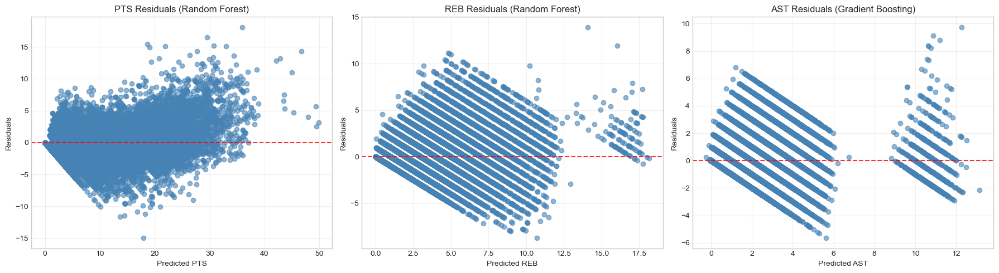

Creating model performance summary...


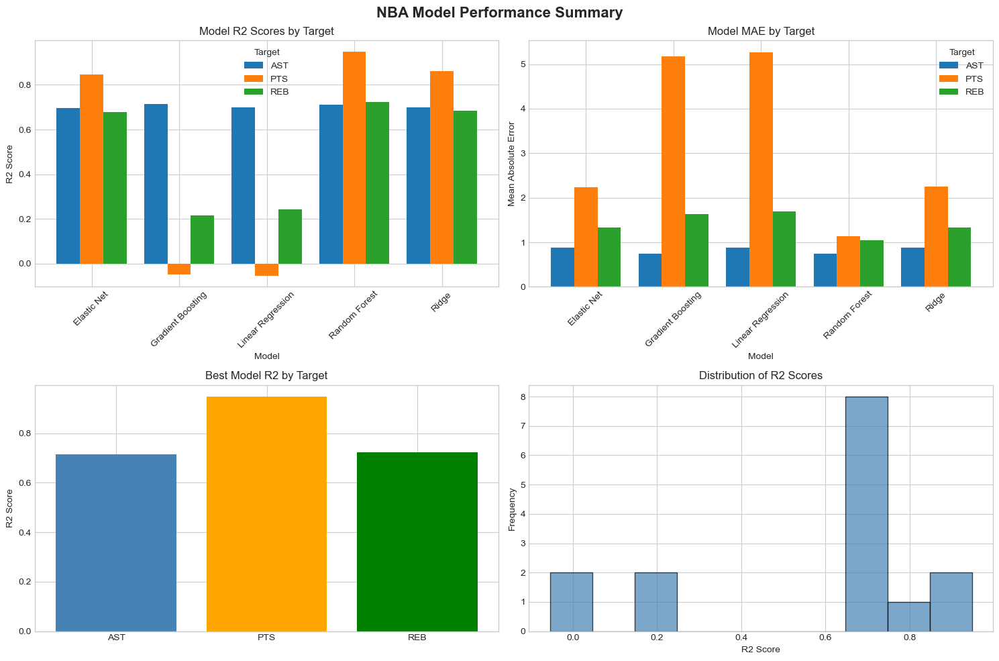

Visualization suite complete!
Visualizations created successfully


In [9]:
# =============================================================================
# Step 7: Create Comprehensive Visualizations
# =============================================================================

if modeling_results:
   
   try:
       # Create visualizations
       create_comprehensive_visualization_suite(pipeline, interpreter, test_results, y_test, importance_results)
       print("Visualizations created successfully")
       
   except Exception as e:
       print(f"Visualization creation failed: {e}")

In [10]:
# =============================================================================
# Step 8: Generate Comprehensive Reports
# =============================================================================

if modeling_results:
   
   try:
       # Generate all reports
       generate_comprehensive_reports(test_results, insights)
       print("Reports generated successfully")
       
   except Exception as e:
       print(f"Report generation failed: {e}")

GENERATING COMPREHENSIVE REPORTS
----------------------------------------

NBA PLAYER PERFORMANCE PREDICTION - EXECUTIVE SUMMARY
Generated: 2025-06-17 00:09:02

MODEL PERFORMANCE:
   PTS:
     Best Model: Random Forest
     Accuracy (R2): 0.948
     Average Error: +/-1.1 pts
     Predictability: High
   REB:
     Best Model: Random Forest
     Accuracy (R2): 0.723
     Average Error: +/-1.0 reb
     Predictability: High
   AST:
     Best Model: Gradient Boosting
     Accuracy (R2): 0.714
     Average Error: +/-0.8 ast
     Predictability: High

KEY FINDINGS:
   1. PREDICTABILITY ANALYSIS:
      • PTS: High (R2 = 0.948)
      • REB: High (R2 = 0.723)
      • AST: High (R2 = 0.714)

   2. TOP PERFORMANCE DRIVERS:
      • PTS: minutes_played, fga_per_min, fta_per_min
      • REB: minutes_played, minutes_played_x_rest_days, sufficient_rest_x_minutes_played
      • AST: ast_outlier_flag, minutes_played, sufficient_rest_x_minutes_played

BUSINESS VALUE:
   • Provides data-driven edge in fant

In [11]:
# =============================================================================
# Step 9: Performance Analysis
# =============================================================================

if modeling_results:
   
   try:
       # Detailed performance analysis
       performance_analysis = analyze_model_performance(test_results, insights, pipeline)
       print("Performance analysis complete")
       
   except Exception as e:
       print(f"Performance analysis failed: {e}")

PERFORMING COMPREHENSIVE PERFORMANCE ANALYSIS
--------------------------------------------------
PREDICTABILITY RANKING:
  1. pts: R2 = 0.948
  2. reb: R2 = 0.723
  3. ast: R2 = 0.714

KEY INSIGHTS:
  - PTS shows high predictability - suitable for confident forecasting

MODEL STABILITY ANALYSIS:
Performance analysis complete


In [12]:
# =============================================================================
# Step 10: Create Model Comparison Table
# =============================================================================

if modeling_results:
   
   try:
       # Create comparison table
       comparison_table = create_model_comparison_table(test_results)
       
       print("MODEL COMPARISON TABLE:")
       print("-" * 25)
       print(comparison_table.to_string(index=False))
       
       # Save to CSV
       comparison_table.to_csv("model_comparison_results.csv", index=False)
       print(f"\nComparison table saved to: model_comparison_results.csv")
       
   except Exception as e:
       print(f"Table creation failed: {e}")

MODEL COMPARISON TABLE:
-------------------------
Target             Model   MAE  RMSE     R2     MAPE (%)  Rank_R2
   PTS Linear Regression 5.267 8.894 -0.054 7.135801e+16      5.0
   PTS             Ridge 2.246 3.221  0.862 2.889992e+17      2.0
   PTS       Elastic Net 2.229 3.397  0.846 2.442123e+17      3.0
   PTS     Random Forest 1.135 1.971  0.948 4.512907e+16      1.0
   PTS Gradient Boosting 5.175 8.869 -0.048 2.031161e+16      4.0
   REB Linear Regression 1.699 2.957  0.242 8.054192e+16      4.0
   REB             Ridge 1.329 1.910  0.684 1.505696e+17      2.0
   REB       Elastic Net 1.330 1.928  0.678 1.453906e+17      3.0
   REB     Random Forest 1.044 1.788  0.723 4.158498e+16      1.0
   REB Gradient Boosting 1.627 3.010  0.214 2.946110e+16      5.0
   AST Linear Regression 0.877 1.301  0.699 1.272225e+17      3.5
   AST             Ridge 0.877 1.301  0.699 1.272310e+17      3.5
   AST       Elastic Net 0.875 1.307  0.697 1.263005e+17      5.0
   AST     Random Forest 0

In [13]:
# =============================================================================
# Step 11: Export Results for Presentation
# =============================================================================

if modeling_results:
   print("EXPORTING RESULTS FOR PRESENTATION")
   print("=" * 40)
   
   try:
       # Export presentation materials
       export_results_for_presentation(test_results, insights)
       
       print("Presentation exports created successfully")
       
   except Exception as e:
       print(f"Export failed: {e}")

EXPORTING RESULTS FOR PRESENTATION
Presentation exports saved to presentation_exports
Files created:
  - model_comparison_20250617_000902.csv (model comparison table)
  - key_metrics_20250617_000902.json (key metrics)
  - feature_importance_20250617_000902.json (feature importance)
Presentation exports created successfully


In [14]:
# =============================================================================
# Step 12: Validate and Save Final Artifacts
# =============================================================================

if modeling_results:
   print("VALIDATING AND SAVING FINAL ARTIFACTS")
   print("=" * 40)
   
   try:
       # Validate model performance
       validation_passed = validate_model_results(test_results, min_r2_threshold=0.3)
       
       if validation_passed:
           print("All models passed validation")
       else:
           print("Some models below performance threshold")
       
       # Save model artifacts
       save_model_artifacts(pipeline, test_results, insights)
       
       print("Model artifacts saved successfully")
       
   except Exception as e:
       print(f"Artifact saving failed: {e}")

print()

VALIDATING AND SAVING FINAL ARTIFACTS
VALIDATING MODEL RESULTS
------------------------------
PASS: PTS best R2 = 0.948
PASS: REB best R2 = 0.723
PASS: AST best R2 = 0.714
All models meet minimum performance criteria
All models passed validation
Model artifacts saved to model_artifacts
Files created:
  - nba_pipeline_20250617_000902.joblib (trained pipeline)
  - model_results_20250617_000902.joblib (results and insights)
  - selected_features_20250617_000902.json (selected features)
Model artifacts saved successfully



In [15]:
# =============================================================================
# Step 13: Create Prediction Function for Testing
# =============================================================================

if modeling_results:
   print("CREATING PREDICTION FUNCTION")
   print("=" * 30)
   
   try:
       # Create prediction function
       predict_function = production_manager.create_prediction_function()
       
       # Test with sample data
       sample_player_data = {
           'minutes_played': 30.0,
           'rest_days': 2,
           'sufficient_rest': True,
           'is_home_game': True,
           'is_weekend': False,
           'player_position': 'G',
           'month': 3,
           'day_of_week': 2
       }
       
       predictions = predict_function(sample_player_data)
       
       print("SAMPLE PREDICTION:")
       print("-" * 20)
       print("Input:")
       for key, value in sample_player_data.items():
           print(f"  {key}: {value}")
       
       print("\nPredicted Performance:")
       for stat, pred in predictions.items():
           print(f"  {stat.upper()}: {pred}")
       
       print("\nPrediction function created and tested successfully")
       
       # Store prediction function for later use
       global prediction_function
       prediction_function = predict_function
       
   except Exception as e:
       print(f"Prediction function creation failed: {e}")

CREATING PREDICTION FUNCTION
SAMPLE PREDICTION:
--------------------
Input:
  minutes_played: 30.0
  rest_days: 2
  sufficient_rest: True
  is_home_game: True
  is_weekend: False
  player_position: G
  month: 3
  day_of_week: 2

Predicted Performance:
  PTS: 2.0
  REB: 1.6
  AST: 1.3

Prediction function created and tested successfully


In [16]:
# =============================================================================
# Final Summary
# =============================================================================

print("PIPELINE EXECUTION SUMMARY")
print("=" * 30)

if modeling_results:
   print("- Modeling pipeline executed successfully")
   print("- Feature importance analysis completed")
   print("- Visualizations created")
   print("- Reports generated")
   print("- Performance analysis completed")
   print("- Model artifacts saved")
   print("- Prediction function ready")
   
   print(f"\nFINAL PERFORMANCE SUMMARY:")
   print("-" * 30)
   for target, performance in insights['model_performance'].items():
       print(f"{target.upper()}: {performance['best_model'].replace('_', ' ').title()} "
             f"(R²={performance['r2']:.3f}, MAE={performance['mae']:.2f})")
   
   print(f"\nGenerated Files:")
   print("- model_comparison_results.csv")
   print("- Various report files in reports/ directory")
   print("- Model artifacts in model_artifacts/ directory")
   print("- Production models in production_models/ directory")
   
else:
   print("Pipeline execution failed")
   print("Please check your data file path and try again")

print(f"\nNBA Player Performance Modeling Complete!")

PIPELINE EXECUTION SUMMARY
- Modeling pipeline executed successfully
- Feature importance analysis completed
- Visualizations created
- Reports generated
- Performance analysis completed
- Model artifacts saved
- Prediction function ready

FINAL PERFORMANCE SUMMARY:
------------------------------
PTS: Random Forest (R²=0.948, MAE=1.14)
REB: Random Forest (R²=0.723, MAE=1.04)
AST: Gradient Boosting (R²=0.714, MAE=0.75)

Generated Files:
- model_comparison_results.csv
- Various report files in reports/ directory
- Model artifacts in model_artifacts/ directory
- Production models in production_models/ directory

NBA Player Performance Modeling Complete!
